In [1]:
import numpy as np
from PIL import Image

In [20]:
# Load image and convert to RGB

img = Image.open('images/girlWithPearlEarring.jpeg')

if img.mode != "RGB":
    img = img.convert("RGB")
    # img.convert("L") # Convert to grayscale

# shape 2500*2112*3 = 15.840.000
arr = np.array(img)

In [23]:
arr[:3, :3]

array([[[37, 28, 11],
        [36, 27, 10],
        [34, 25,  8]],

       [[32, 23,  6],
        [32, 23,  6],
        [32, 23,  6]],

       [[26, 17,  0],
        [28, 19,  2],
        [31, 22,  5]]], dtype=uint8)

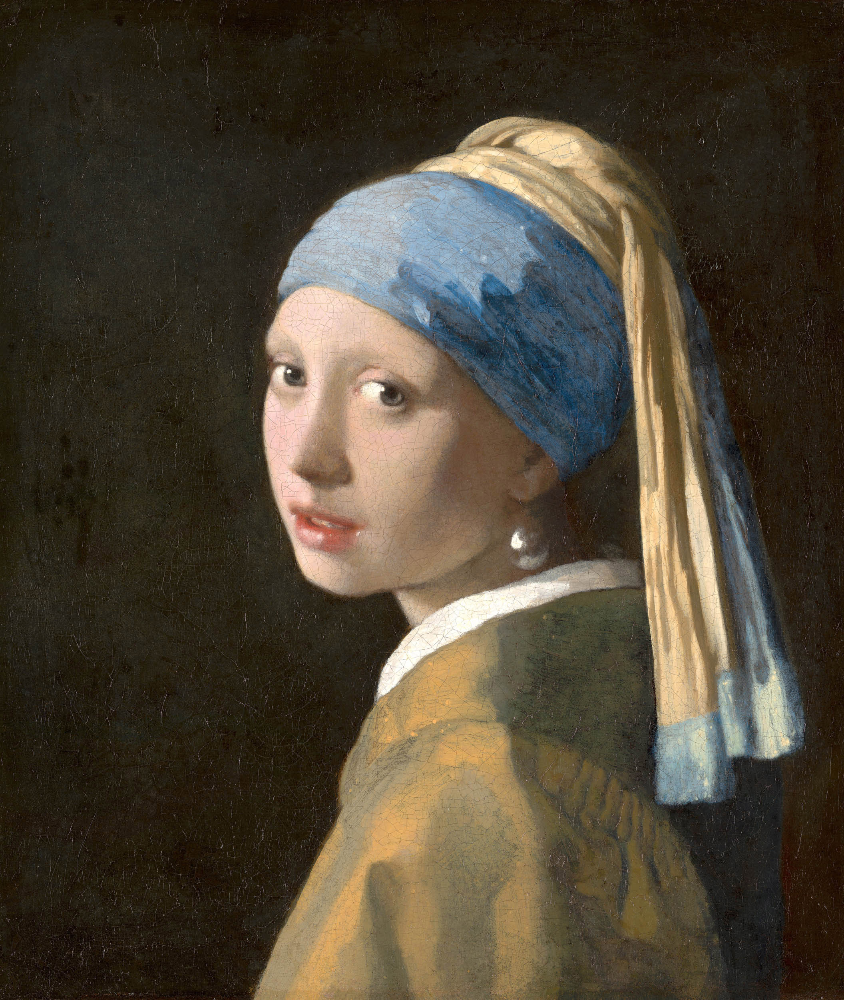

In [24]:
img

In [ ]:
# take the height and width of the image
h, w, _ = arr.shape

# create an array of zeros
pixelated = np.zeros_like(arr)

In [106]:
avg_colors = []
n = 10

# Split coordinates into n intervals (handles uneven sizes)
y_splits = np.linspace(0, h, n+1, dtype=int)
x_splits = np.linspace(0, w, n+1, dtype=int)

In [107]:
y_splits

array([   0,  250,  500,  750, 1000, 1250, 1500, 1750, 2000, 2250, 2500])

In [108]:
x_splits

array([   0,  211,  422,  633,  844, 1056, 1267, 1478, 1689, 1900, 2112])

In [109]:
for i in range(n):
    row_colors = []
    for j in range(n):
        y1, y2 = y_splits[i], y_splits[i+1]
        x1, x2 = x_splits[j], x_splits[j+1]

        block = arr[y1:y2, x1:x2]
        avg_color = block.mean(axis=(0, 1)).astype(int)  # (R,G,B)

        # Fill the region with the average color
        pixelated[y1:y2, x1:x2] = avg_color

        row_colors.append(tuple(avg_color))
    avg_colors.append(row_colors)

# Convert pixelated array back to image
pixelated_img = Image.fromarray(pixelated)
# pixelated_img.save(save_path)

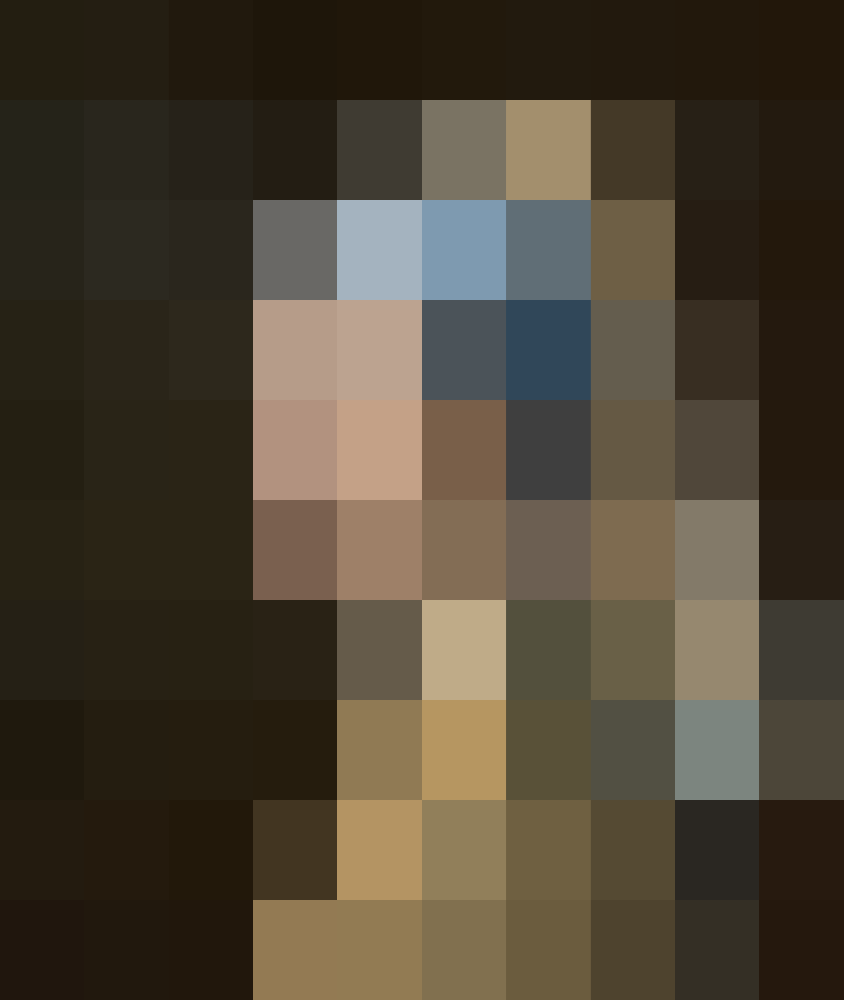

In [110]:
pixelated_img